# Julia is fast

Very often, benchmarks are used to compare languages.  These benchmarks can lead to long discussions, first as to exactly what is being benchmarked and secondly what explains the differences.  These simple questions can sometimes get more complicated than you at first might imagine.

The purpose of this notebook is for you to see a simple benchmark for yourself.  One can read the notebook and see what happened on the author's Macbook Pro with a 4-core Intel Core I7, or run the notebook yourself.

(This material began life as a wonderful lecture by Steven Johnson at MIT: https://github.com/stevengj/18S096-iap17/blob/master/lecture1/Boxes-and-registers.ipynb.)

# `sum`: An easy enough function to understand

Consider the  **sum** function `sum(a)`, which computes
$$
\mathrm{sum}(a) = \sum_{i=1}^n a_i,
$$
where $n$ is the length of `a`.

In [1]:
a = rand(10^7) # 1D vector of random numbers, uniform on [0,1)

10000000-element Array{Float64,1}:
 0.6934592903336081  
 0.8924756132911602  
 0.10068237228001586 
 0.7131076412955273  
 0.06328332803986148 
 0.031783342402894155
 0.1467900168690699  
 0.27521514647069245 
 0.3190238545663455  
 0.21687545004061803 
 0.3833267809957348  
 0.23671445784149525 
 0.6800513931895369  
 ⋮                   
 0.374454354119387   
 0.7730899246078438  
 0.44732716734956646 
 0.8996471752072734  
 0.5959918178739234  
 0.5251851983258942  
 0.1271084744917821  
 0.8003081744169405  
 0.9598851422373549  
 0.1271318997867532  
 0.9629245804756599  
 0.004154853300606387

In [2]:
sum(a) # Remember 5,001,672 (and change)

5.00167232684258e6

The expected result is 0.5 * 10^7, since the mean of each entry is 0.5

# Benchmarking a few ways in a few languages

Julia has a `BenchmarkTools.jl` package for easy and accurate benchmarking:

In [5]:
using Pkg

In [6]:
Pkg.add("BenchmarkTools")

  Updating registry at `~/.julia/registries/General`
  Updating git-repo `https://github.com/JuliaRegistries/General.git`
Fetching: [========================================>]  99.9 %0.0 %]  14.3 %============>                            ]  28.7 %42.9 %>                 ]  57.2 % [=============================>           ]  71.5 %==================================>      ]  83.1 %]  97.3 % Resolving package versions...
 Installed InteractBase ────── v0.8.1
 Installed BenchmarkTools ──── v0.4.1
 Installed IJulia ──────────── v1.11.1
 Installed Plots ───────────── v0.20.2
 Installed Mustache ────────── v0.5.0
 Installed WebIO ───────────── v0.3.2
 Installed PlotlyBase ──────── v0.2.2
 Installed FixedPointNumbers ─ v0.5.3
 Installed SoftGlobalScope ─── v1.0.4
 Installed Widgets ─────────── v0.4.2
 Installed ZMQ ─────────────── v1.0.0
 Installed PlotlyJS ────────── v0.11.0
 Installed GR ──────────────── v0.34.0
  Updating `~/.julia/environments/v1.0/Project.toml`
  [6e4b80f9] + BenchmarkToo

In [7]:
using BenchmarkTools

┌ Info: Precompiling BenchmarkTools [6e4b80f9-dd63-53aa-95a3-0cdb28fa8baf]
└ @ Base loading.jl:1186


#  1. The C language

C is often considered the gold standard: difficult on the human, nice for the machine. Getting within a factor of 2 of C is often satisfying. Nonetheless, even within C, there are many kinds of optimizations possible that a naive C writer may or may not get the advantage of.

The current author does not speak C, so he does not read the cell below, but is happy to know that you can put C code in a Julia session, compile it, and run it. Note that the `"""` wrap a multi-line string.

In [8]:
using Libdl

In [9]:
C_code = """
#include <stddef.h>
double c_sum(size_t n, double *X) {
    double s = 0.0;
    for (size_t i = 0; i < n; ++i) {
        s += X[i];
    }
    return s;
}
"""

const Clib = tempname()   # make a temporary file


# compile to a shared library by piping C_code to gcc
# (works only if you have gcc installed):

open(`gcc  -fPIC -O3 -ffast-math -msse3 -xc -shared -o $(Clib * "." * Libdl.dlext) -`, "w") do f
    print(f, C_code) 
end

# define a Julia function that calls the C function:
c_sum(X::Array{Float64}) = ccall(("c_sum", Clib), Float64, (Csize_t, Ptr{Float64}), length(X), X)

c_sum (generic function with 1 method)

In [10]:
c_sum(a)

5.001672326842462e6

In [11]:
c_sum(a) - sum(a) # Compare the c_sum with the julia built in sum

-1.1827796697616577e-7

In [12]:
c_sum(a) ≈ sum(a) # type \approx and then <TAB> to get the ≈ symbolb

true

In [13]:
≈  # alias for the `isapprox` function

isapprox (generic function with 8 methods)

In [14]:
?isapprox

search: isapprox



```
isapprox(x, y; rtol::Real=atol>0 ? 0 : √eps, atol::Real=0, nans::Bool=false, norm::Function)
```

Inexact equality comparison: `true` if `norm(x-y) <= max(atol, rtol*max(norm(x), norm(y)))`. The default `atol` is zero and the default `rtol` depends on the types of `x` and `y`. The keyword argument `nans` determines whether or not NaN values are considered equal (defaults to false).

For real or complex floating-point values, if an `atol > 0` is not specified, `rtol` defaults to the square root of [`eps`](@ref) of the type of `x` or `y`, whichever is bigger (least precise). This corresponds to requiring equality of about half of the significand digits. Otherwise, e.g. for integer arguments or if an `atol > 0` is supplied, `rtol` defaults to zero.

`x` and `y` may also be arrays of numbers, in which case `norm` defaults to `vecnorm` but may be changed by passing a `norm::Function` keyword argument. (For numbers, `norm` is the same thing as `abs`.) When `x` and `y` are arrays, if `norm(x-y)` is not finite (i.e. `±Inf` or `NaN`), the comparison falls back to checking whether all elements of `x` and `y` are approximately equal component-wise.

The binary operator `≈` is equivalent to `isapprox` with the default arguments, and `x ≉ y` is equivalent to `!isapprox(x,y)`.

Note that `x ≈ 0` (i.e., comparing to zero with the default tolerances) is equivalent to `x == 0` since the default `atol` is `0`.  In such cases, you should either supply an appropriate `atol` (or use `norm(x) ≤ atol`) or rearrange your code (e.g. use `x ≈ y` rather than `x - y ≈ 0`).   It is not possible to pick a nonzero `atol` automatically because it depends on the overall scaling (the "units") of your problem: for example, in `x - y ≈ 0`, `atol=1e-9` is an absurdly small tolerance if `x` is the [radius of the Earth](https://en.wikipedia.org/wiki/Earth_radius) in meters, but an absurdly large tolerance if `x` is the [radius of a Hydrogen atom](https://en.wikipedia.org/wiki/Bohr_radius) in meters.

# Examples

```jldoctest
julia> 0.1 ≈ (0.1 - 1e-10)
true

julia> isapprox(10, 11; atol = 2)
true

julia> isapprox([10.0^9, 1.0], [10.0^9, 2.0])
true

julia> 1e-10 ≈ 0
false

julia> isapprox(1e-10, 0, atol=1e-8)
true
```


We can now benchmark the C code directly from Julia:

In [15]:
c_bench = @benchmark c_sum($a)

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     4.470 ms (0.00% GC)
  median time:      5.684 ms (0.00% GC)
  mean time:        6.128 ms (0.00% GC)
  maximum time:     15.855 ms (0.00% GC)
  --------------
  samples:          813
  evals/sample:     1

In [16]:
println("C: Fastest time was $(minimum(c_bench.times) / 1e6) msec")

C: Fastest time was 4.469947 msec


In [17]:
d = Dict()  # a "dictionary", i.e. an associative array
d["C"] = minimum(c_bench.times) / 1e6  # in milliseconds
d

Dict{Any,Any} with 1 entry:
  "C" => 4.46995

In [18]:
using Plots
gr()

┌ Info: Recompiling stale cache file /Users/edelman/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1184


┌ Info: Recompiling stale cache file /Users/edelman/.julia/compiled/v1.0/GR/NDU5Y.ji for GR [28b8d3ca-fb5f-59d9-8090-bfdbd6d07a71]
└ @ Base loading.jl:1184


Plots.GRBackend()

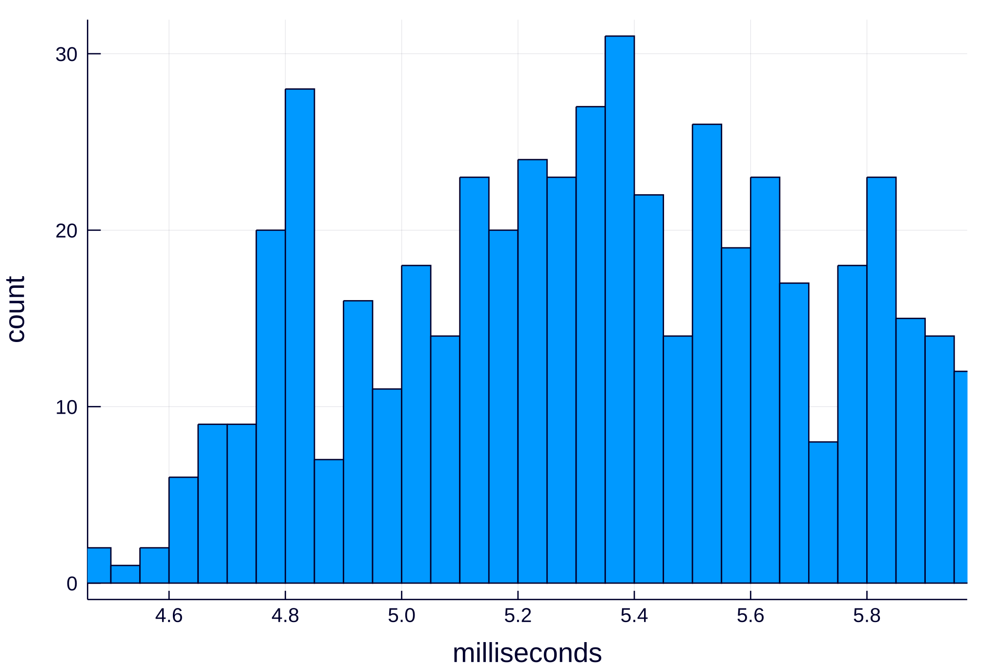

In [19]:
using Statistics

t = c_bench.times / 1e6 # times in milliseconds
m, σ = minimum(t), std(t)

histogram(t, bins=500,
    xlim=(m - 0.01, m + σ),
    xlabel="milliseconds", ylabel="count", label="")

# 2. Python's built in `sum`

The `PyCall` package provides a Julia interface to Python:

In [20]:
]add PyCall

 Resolving package versions...
 Installed PyCall ─ v1.18.4
  Updating `~/.julia/environments/v1.0/Project.toml`
  [438e738f] + PyCall v1.18.4
  Updating `~/.julia/environments/v1.0/Manifest.toml`
  [438e738f] + PyCall v1.18.4
  Building PyCall → `~/.julia/packages/PyCall/rUul9/deps/build.log`


In [21]:
using PyCall

┌ Info: Precompiling PyCall [438e738f-606a-5dbb-bf0a-cddfbfd45ab0]
└ @ Base loading.jl:1186


In [22]:
# Call a low-level PyCall function to get a Python list, because
# by default PyCall will convert to a NumPy array instead (we benchmark NumPy below):

apy_list = PyCall.array2py(a, 1, 1)

# get the Python built-in "sum" function:
pysum = pybuiltin("sum")

PyObject <built-in function sum>

In [23]:
pysum(a)

5.00167232684252e6

In [24]:
pysum(a) ≈ sum(a)

true

In [25]:
py_list_bench = @benchmark $pysum($apy_list)

BenchmarkTools.Trial: 
  memory estimate:  48 bytes
  allocs estimate:  3
  --------------
  minimum time:     55.237 ms (0.00% GC)
  median time:      58.257 ms (0.00% GC)
  mean time:        60.531 ms (0.00% GC)
  maximum time:     95.298 ms (0.00% GC)
  --------------
  samples:          83
  evals/sample:     1

In [26]:
d["Python built-in"] = minimum(py_list_bench.times) / 1e6
d

Dict{Any,Any} with 2 entries:
  "C"               => 4.46995
  "Python built-in" => 55.2369

# 3. Python: `numpy` 

## Takes advantage of hardware "SIMD", but only works when it works.

`numpy` is an optimized C library, callable from Python.
It may be installed within Julia as follows:

In [32]:
Pkg.add("Conda")

 Resolving package versions...
  Updating `~/.julia/environments/v1.0/Project.toml`
  [8f4d0f93] + Conda v1.0.1
  Updating `~/.julia/environments/v1.0/Manifest.toml`
 [no changes]


In [27]:
using Conda 
#Conda.add("numpy")

ArgumentError: ArgumentError: Package Conda not found in current path:
- Run `Pkg.add("Conda")` to install the Conda package.


In [28]:
numpy_sum = pyimport("numpy")["sum"]
apy_numpy = PyObject(a) # converts to a numpy array by default

py_numpy_bench = @benchmark $numpy_sum($apy_numpy)

BenchmarkTools.Trial: 
  memory estimate:  48 bytes
  allocs estimate:  3
  --------------
  minimum time:     4.710 ms (0.00% GC)
  median time:      5.317 ms (0.00% GC)
  mean time:        5.589 ms (0.00% GC)
  maximum time:     10.056 ms (0.00% GC)
  --------------
  samples:          891
  evals/sample:     1

In [29]:
numpy_sum(apy_list) # python thing

5.001672326842584e6

In [30]:
numpy_sum(apy_list) ≈ sum(a)

true

In [31]:
d["Python numpy"] = minimum(py_numpy_bench.times) / 1e6
d

Dict{Any,Any} with 3 entries:
  "C"               => 4.46995
  "Python numpy"    => 4.70977
  "Python built-in" => 55.2369

# 4. Python, hand-written

In [33]:
py"""
def py_sum(a):
    s = 0.0
    for x in a:
        s = s + x
    return s
"""

sum_py = py"py_sum"

PyObject <function py_sum at 0x13bcfba60>

In [34]:
py_hand = @benchmark $sum_py($apy_list)

BenchmarkTools.Trial: 
  memory estimate:  48 bytes
  allocs estimate:  3
  --------------
  minimum time:     285.349 ms (0.00% GC)
  median time:      309.277 ms (0.00% GC)
  mean time:        313.935 ms (0.00% GC)
  maximum time:     360.415 ms (0.00% GC)
  --------------
  samples:          16
  evals/sample:     1

In [35]:
sum_py(apy_list)

5.00167232684252e6

In [36]:
sum_py(apy_list) ≈ sum(a)

true

In [37]:
d["Python hand-written"] = minimum(py_hand.times) / 1e6
d

Dict{Any,Any} with 4 entries:
  "C"                   => 4.46995
  "Python numpy"        => 4.70977
  "Python hand-written" => 285.349
  "Python built-in"     => 55.2369

# 5. Julia (built-in) 

## Written directly in Julia, not in C!

In [46]:
@which sum(a)

sum(a::AbstractArray) in Base at reducedim.jl:645

In [39]:
j_bench = @benchmark sum($a)

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     4.570 ms (0.00% GC)
  median time:      5.275 ms (0.00% GC)
  mean time:        5.531 ms (0.00% GC)
  maximum time:     10.868 ms (0.00% GC)
  --------------
  samples:          901
  evals/sample:     1

In [40]:
d["Julia built-in"] = minimum(j_bench.times) / 1e6
d

Dict{Any,Any} with 5 entries:
  "C"                   => 4.46995
  "Python numpy"        => 4.70977
  "Python hand-written" => 285.349
  "Python built-in"     => 55.2369
  "Julia built-in"      => 4.57007

# 6. Julia (hand-written)

In [41]:
function mysum(A)   
    s = 0.0  # s = zero(eltype(A))
    # @inbounds @simd for a in A
    for a in A
        s += a
    end
    s
end

mysum (generic function with 1 method)

In [42]:
j_bench_hand = @benchmark mysum($a)

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     8.252 ms (0.00% GC)
  median time:      8.820 ms (0.00% GC)
  mean time:        9.014 ms (0.00% GC)
  maximum time:     13.842 ms (0.00% GC)
  --------------
  samples:          554
  evals/sample:     1

In [43]:
d["Julia hand-written"] = minimum(j_bench_hand.times) / 1e6
d

Dict{Any,Any} with 6 entries:
  "C"                   => 4.46995
  "Python numpy"        => 4.70977
  "Julia hand-written"  => 8.25221
  "Python hand-written" => 285.349
  "Python built-in"     => 55.2369
  "Julia built-in"      => 4.57007

# Summary

In [44]:
for (key, value) in sort(collect(d))
    println(rpad(key, 20, "."), lpad(round(value, digits=1), 8, "."))
end

C........................4.5
Julia built-in...........4.6
Julia hand-written.......8.3
Python built-in.........55.2
Python hand-written....285.3
Python numpy.............4.7


In [45]:
for (key, value) in sort(collect(d), by=x->x[2])
    println(rpad(key, 20, "."), lpad(round(value, digits=2), 10, "."))
end

C.........................4.47
Julia built-in............4.57
Python numpy..............4.71
Julia hand-written........8.25
Python built-in..........55.24
Python hand-written.....285.35
